# WLVID_YourFullName.ipynb



### Part A: CNN from Scratch
- Data understanding, analysis, visualization, and cleaning
- Baseline CNN with **3 convolutional layers**, pooling, **3 fully connected layers**, and a softmax output layer
- Deeper CNN with at least double the convolutional depth and regularization
- Training/validation loss and accuracy curves
- Accuracy, precision, recall, F1-score, confusion matrix, and sample inference
- Baseline vs deeper model comparison
- Computational cost comparison
- Optimizer comparison: **SGD vs Adam**
- Ablation study by removing dropout only
- Challenges and observations

### Part B: Transfer Learning
- ResNet50 pretrained on ImageNet
- Feature extraction with frozen convolutional base
- Fine-tuning with lower learning rate
- Final comparison with models trained from scratch



In [ ]:
# =============================
# 1. Imports and Setup
# =============================
# Imports for data handling, visualization, CNN modelling, transfer learning,
# evaluation, and timing experiments.

import os
import time
import random
import warnings
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras import layers, models, regularizers
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.utils import image_dataset_from_directory

from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score

warnings.filterwarnings("ignore")

print("TensorFlow version:", tf.__version__)
print("GPU available:", bool(tf.config.list_physical_devices('GPU')))

SEED = 42
tf.random.set_seed(SEED)
np.random.seed(SEED)
random.seed(SEED)

AUTOTUNE = tf.data.AUTOTUNE


2026-05-10 04:23:47.180978: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1778387027.364898      57 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1778387027.418884      57 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1778387027.885889      57 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1778387027.885933      57 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1778387027.885935      57 computation_placer.cc:177] computation placer alr

TensorFlow version: 2.19.0
GPU available: True


In [ ]:
# =============================
# 3. Dataset Paths
# =============================
# Change ONLY this base path to your actual dataset location.
# Expected folder structure:
# BASE_DIR/seg_train/seg_train/<class folders>
# BASE_DIR/seg_test/seg_test/<class folders>
# BASE_DIR/seg_pred/seg_pred/<unlabelled images>

BASE_DIR = Path('/kaggle/input/datasets/puneet6060/intel-image-classification')

train_dir = BASE_DIR / 'seg_train' / 'seg_train'
test_dir  = BASE_DIR / 'seg_test' / 'seg_test'
pred_dir  = BASE_DIR / 'seg_pred' / 'seg_pred'

print("Train dir exists:", train_dir.exists(), train_dir)
print("Test dir exists :", test_dir.exists(), test_dir)
print("Pred dir exists :", pred_dir.exists(), pred_dir)

if not train_dir.exists() or not test_dir.exists():
    print("\nWARNING: Update BASE_DIR before running the modelling cells.")


Train dir exists: True /kaggle/input/datasets/puneet6060/intel-image-classification/seg_train/seg_train
Test dir exists : True /kaggle/input/datasets/puneet6060/intel-image-classification/seg_test/seg_test
Pred dir exists : True /kaggle/input/datasets/puneet6060/intel-image-classification/seg_pred/seg_pred


### Path Check Comment

The notebook will work only after `BASE_DIR` points to the folder containing `seg_train`, `seg_test`, and `seg_pred`. If the path is wrong, the exploration and training cells will not run correctly.


## About the Dataset

The Intel Image Classification dataset is a natural scene image classification dataset. It contains six scene categories:

- buildings
- forest
- glacier
- mountain
- sea
- street

The goal is to learn visual patterns such as edges, textures, shapes, and scene-level structures, then classify each image into the correct scene category. This is appropriate for the assessment because the task requires an image-format dataset and end-to-end CNN image classification.


In [ ]:
# =============================
# 4. Basic Dataset Exploration
# =============================
# Class names are taken from the training folder names.

class_names = sorted([folder.name for folder in train_dir.iterdir() if folder.is_dir()]) if train_dir.exists() else []
print("Classes detected:", class_names)
print("Number of classes:", len(class_names))


Classes detected: ['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']
Number of classes: 6


In [ ]:
# Count image files in train/test folders.
# Only common image extensions are counted to avoid accidentally counting system files.

IMAGE_EXTENSIONS = {'.jpg', '.jpeg', '.png', '.bmp', '.gif'}

def count_images(folder):
    if not folder.exists():
        return 0
    return sum(1 for f in folder.iterdir() if f.is_file() and f.suffix.lower() in IMAGE_EXTENSIONS)

train_counts = {}
test_counts = {}

if train_dir.exists():
    for cls in class_names:
        train_counts[cls] = count_images(train_dir / cls)

if test_dir.exists():
    for cls in class_names:
        test_counts[cls] = count_images(test_dir / cls)

train_df = pd.DataFrame({
    'class': list(train_counts.keys()),
    'train_images': list(train_counts.values()),
    'test_images': [test_counts.get(cls, 0) for cls in train_counts.keys()]
})

train_df['total_images'] = train_df['train_images'] + train_df['test_images']
train_df


,class,train_images,test_images,total_images
0,buildings,2191,437,2628
1,forest,2271,474,2745
2,glacier,2404,553,2957
3,mountain,2512,525,3037
4,sea,2274,510,2784
5,street,2382,501,2883


In [ ]:
total_train = sum(train_counts.values())
total_test = sum(test_counts.values())
total_pred = len(list(pred_dir.glob('*'))) if pred_dir.exists() else 0

print("Total training images:", total_train)
print("Total test images:", total_test)
print("Total prediction images (unlabeled):", total_pred)
print("Grand total images:", total_train + total_test + total_pred)

Total training images: 14034
Total test images: 3000
Total prediction images (unlabeled): 7301
Grand total images: 24335


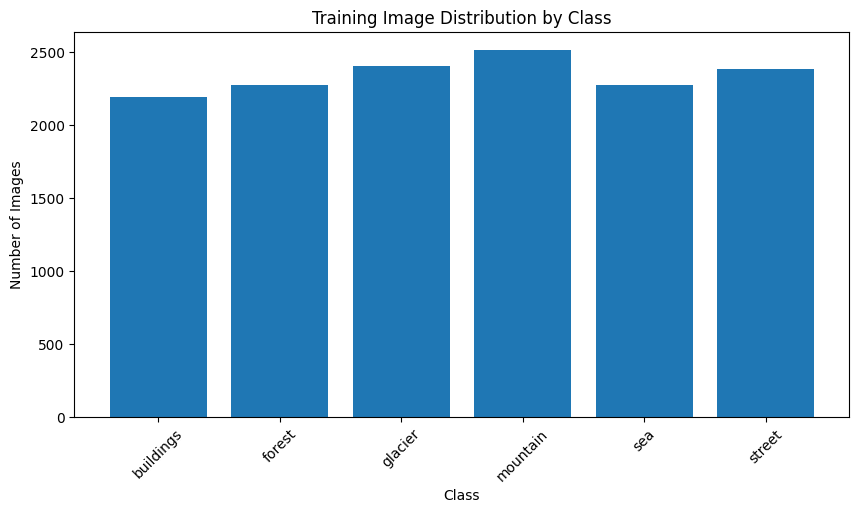

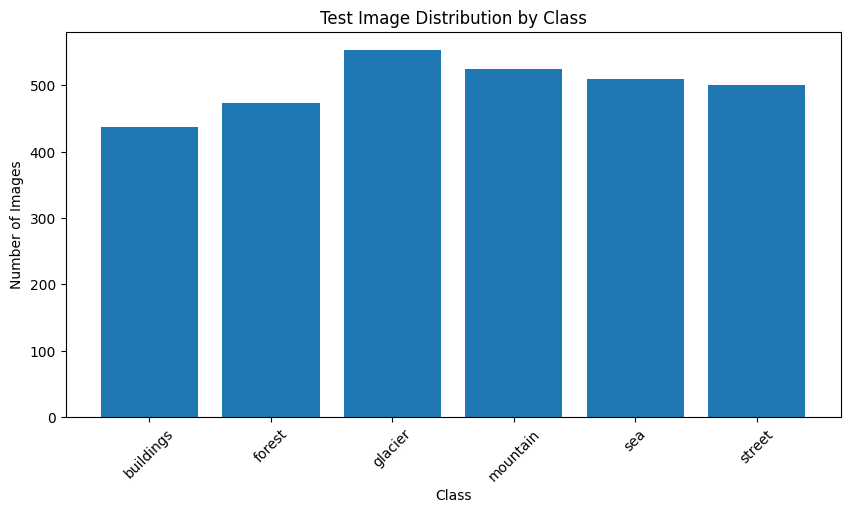

In [ ]:
# Visualize class distribution
plt.figure(figsize=(10,5))
plt.bar(train_df['class'], train_df['train_images'])
plt.title('Training Image Distribution by Class')
plt.xlabel('Class')
plt.ylabel('Number of Images')
plt.xticks(rotation=45)
plt.show()

plt.figure(figsize=(10,5))
plt.bar(train_df['class'], train_df['test_images'])
plt.title('Test Image Distribution by Class')
plt.xlabel('Class')
plt.ylabel('Number of Images')
plt.xticks(rotation=45)
plt.show()

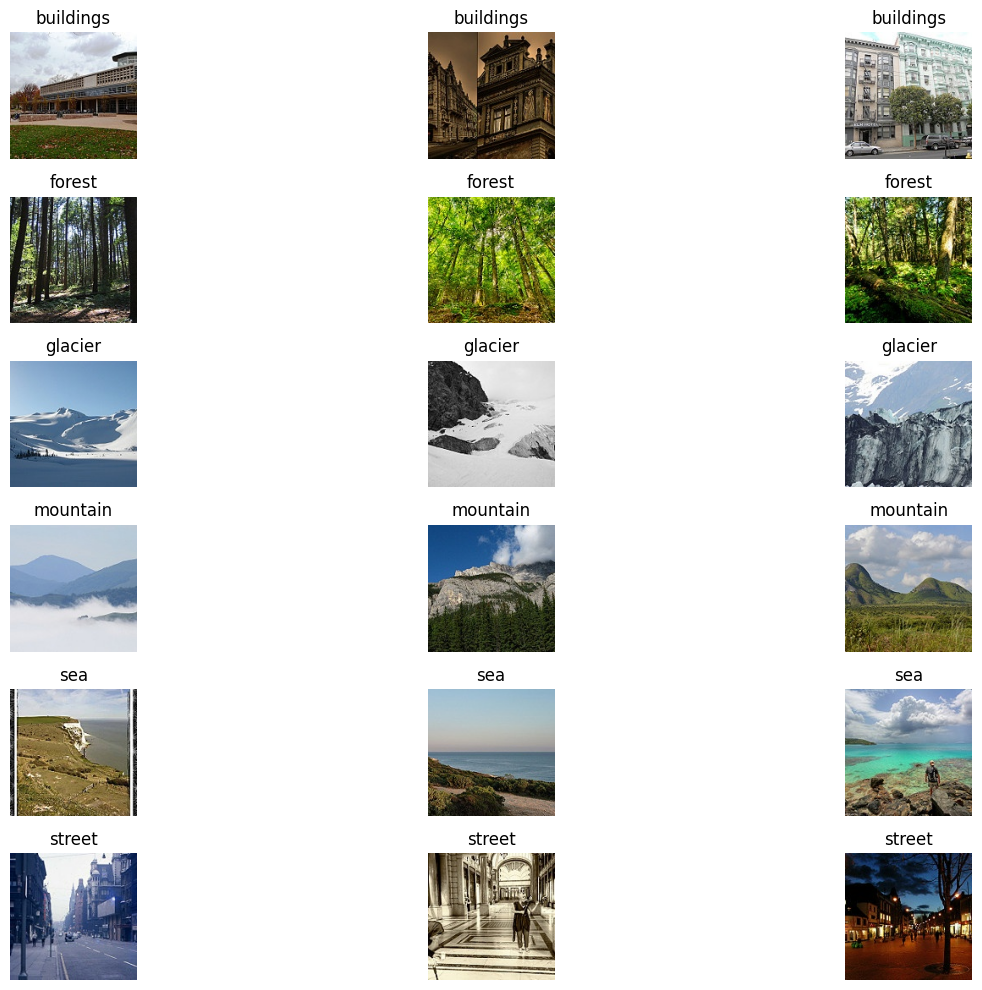

In [ ]:
# =============================
# 5. Show Sample Images
# =============================
import matplotlib.image as mpimg

def show_sample_images_from_folder(base_folder, classes, samples_per_class=3, figsize=(15, 10)):
    plt.figure(figsize=figsize)
    plot_index = 1

    for cls in classes:
        image_files = list((base_folder / cls).glob('*'))
        sampled = image_files[:samples_per_class]

        for img_path in sampled:
            img = mpimg.imread(img_path)
            plt.subplot(len(classes), samples_per_class, plot_index)
            plt.imshow(img)
            plt.title(cls)
            plt.axis('off')
            plot_index += 1

    plt.tight_layout()
    plt.show()

if train_dir.exists() and class_names:
    show_sample_images_from_folder(train_dir, class_names, samples_per_class=3)

## Train / Validation / Test Split Justification

The original dataset already provides separate training and test folders. To compare models fairly, the training folder is further split into:

- **80% training subset** for learning model parameters
- **20% validation subset** for monitoring generalization and selecting the best training epoch

The **test folder is kept untouched** until final evaluation. This avoids tuning the model directly on test data and gives a more reliable estimate of real-world performance.


In [ ]:
# =============================
# 6. Dataset Parameters
# =============================
# 224x224 is compatible with ImageNet pretrained models, including ResNet50.

IMG_SIZE = (224, 224)
BATCH_SIZE = 32
VAL_SPLIT = 0.2
NUM_CLASSES = len(class_names)

print("Image size:", IMG_SIZE)
print("Batch size:", BATCH_SIZE)
print("Validation split:", VAL_SPLIT)
print("Number of classes:", NUM_CLASSES)


Image size: (224, 224)
Batch size: 32
Validation split: 0.2
Number of classes: 6


In [ ]:
# =============================
# 7. Create Training / Validation / Test Datasets
# =============================
train_ds = image_dataset_from_directory(
    train_dir,
    validation_split=VAL_SPLIT,
    subset='training',
    seed=SEED,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    label_mode='categorical'
)

val_ds = image_dataset_from_directory(
    train_dir,
    validation_split=VAL_SPLIT,
    subset='validation',
    seed=SEED,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    label_mode='categorical'
)

test_ds = image_dataset_from_directory(
    test_dir,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    shuffle=False,
    label_mode='categorical'
)

dataset_class_names = train_ds.class_names
print("Detected classes:", dataset_class_names)

Found 14034 files belonging to 6 classes.
Using 11228 files for training.


I0000 00:00:1778387123.852214      57 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13757 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1778387123.858241      57 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13757 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


Found 14034 files belonging to 6 classes.
Using 2806 files for validation.
Found 3000 files belonging to 6 classes.
Detected classes: ['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']


In [ ]:
# Performance optimization
train_ds = train_ds.prefetch(AUTOTUNE)
val_ds = val_ds.prefetch(AUTOTUNE)
test_ds = test_ds.prefetch(AUTOTUNE)

In [ ]:
# =============================
# 8. Preprocessing and Augmentation
# =============================
data_augmentation = keras.Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.1),
    layers.RandomContrast(0.1),
], name="data_augmentation")

normalization = layers.Rescaling(1./255)

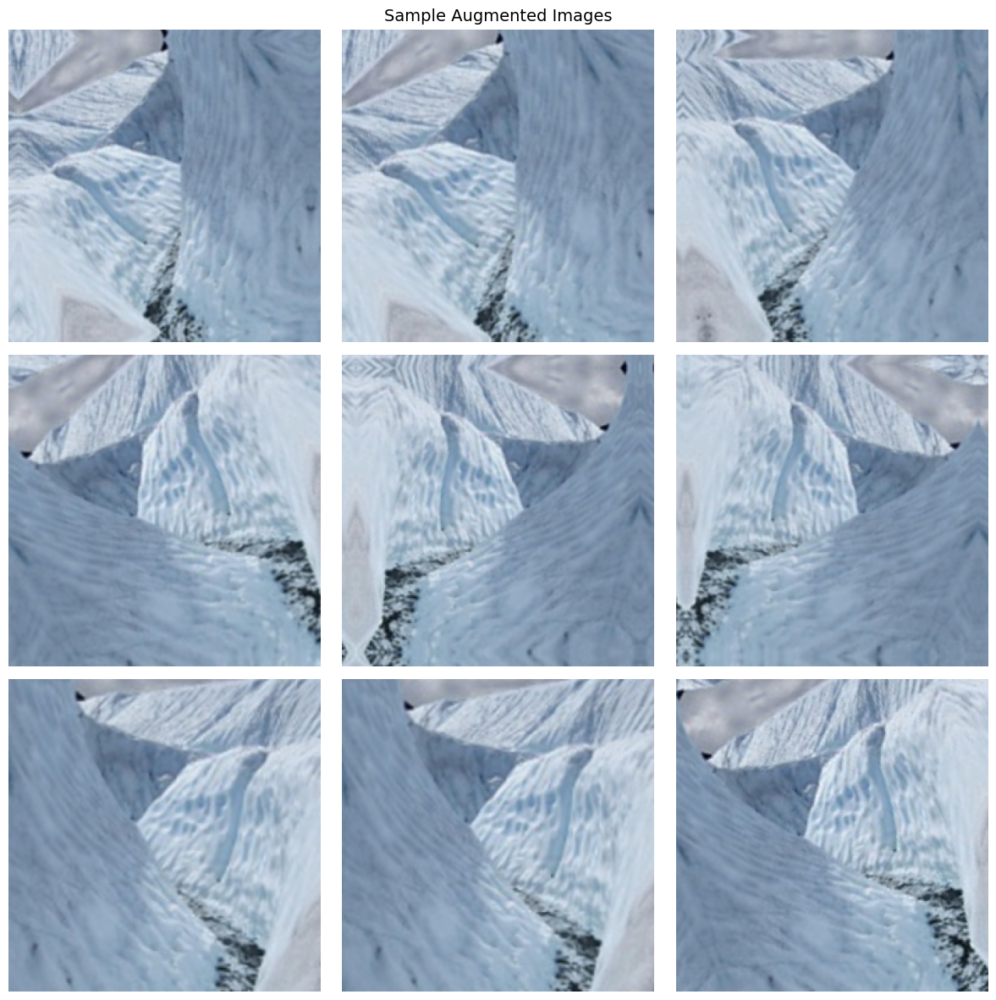

In [ ]:
# Visualize augmented samples
plt.figure(figsize=(12, 12))
for images, labels in train_ds.take(1):
    first_image = images[0]
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        augmented_image = data_augmentation(tf.expand_dims(first_image, 0), training=True)
        plt.imshow(tf.cast(augmented_image[0], tf.uint8))
        plt.axis("off")
plt.suptitle("Sample Augmented Images", fontsize=14)
plt.tight_layout()
plt.show()

## Preprocessing and Augmentation Applied

- Every image is resized to **224 × 224** pixels.
- Pixel values are normalized to the `[0, 1]` range for the CNN models trained from scratch.
- Data augmentation is applied only during training: random horizontal flip, random rotation, random zoom, and random contrast.
- Augmentation increases the variety of training images and helps reduce overfitting.
- For transfer learning with ResNet50, the notebook uses `preprocess_input` because ResNet50 expects ImageNet-style preprocessing.


In [ ]:
# =============================
# 9. Helper Functions
# =============================
# These functions keep evaluation consistent across all models.

def plot_history(history, title='Training History'):
    hist = pd.DataFrame(history.history)
    plt.figure(figsize=(8, 5))
    plt.plot(hist.index + 1, hist['loss'], label='Train Loss')
    plt.plot(hist.index + 1, hist['val_loss'], label='Validation Loss')
    plt.title(title + ' - Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

    plt.figure(figsize=(8, 5))
    plt.plot(hist.index + 1, hist['accuracy'], label='Train Accuracy')
    plt.plot(hist.index + 1, hist['val_accuracy'], label='Validation Accuracy')
    plt.title(title + ' - Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.show()


def evaluate_model(model, test_dataset, class_names, model_name='Model'):
    start = time.time()
    probs = model.predict(test_dataset, verbose=1)
    inference_time = time.time() - start

    y_true = np.concatenate([np.argmax(y.numpy(), axis=1) for x, y in test_dataset], axis=0)
    y_pred = np.argmax(probs, axis=1)

    acc = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, average='weighted', zero_division=0)
    recall = recall_score(y_true, y_pred, average='weighted', zero_division=0)
    f1 = f1_score(y_true, y_pred, average='weighted', zero_division=0)

    print(f"\n{model_name} Results")
    print("-" * 50)
    print("Accuracy :", round(acc, 4))
    print("Precision:", round(precision, 4))
    print("Recall   :", round(recall, 4))
    print("F1-score :", round(f1, 4))
    print("Inference time (seconds):", round(inference_time, 2))

    print("\nClassification Report:")
    print(classification_report(y_true, y_pred, target_names=class_names, zero_division=0))

    cm = confusion_matrix(y_true, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
    fig, ax = plt.subplots(figsize=(8, 8))
    disp.plot(ax=ax, xticks_rotation=45, colorbar=False)
    plt.title(f'{model_name} - Confusion Matrix')
    plt.show()

    return {
        'model_name': model_name,
        'accuracy': acc,
        'precision': precision,
        'recall': recall,
        'f1_score': f1,
        'inference_time_sec': inference_time
    }


def show_predictions(model, dataset, class_names, num_images=9, preprocess_fn=None):
    # If preprocess_fn is provided, it is applied only to model input.
    # The displayed image remains raw, so transfer-learning images display correctly.
    plt.figure(figsize=(12, 12))
    for images, labels in dataset.take(1):
        model_images = images
        if preprocess_fn is not None:
            model_images = preprocess_fn(tf.cast(images, tf.float32))

        probs = model.predict(model_images, verbose=0)
        preds = np.argmax(probs, axis=1)
        true_labels = np.argmax(labels.numpy(), axis=1)

        for i in range(min(num_images, len(images))):
            ax = plt.subplot(3, 3, i + 1)
            plt.imshow(images[i].numpy().astype("uint8"))
            pred_name = class_names[preds[i]]
            true_name = class_names[true_labels[i]]
            title_prefix = "Correct" if preds[i] == true_labels[i] else "Wrong"
            plt.title(f"{title_prefix}\nPred: {pred_name}\nTrue: {true_name}")
            plt.axis("off")
    plt.tight_layout()
    plt.show()


def get_callbacks():
    # Create fresh callback objects for each model training run.
    return [
        EarlyStopping(monitor='val_loss', patience=7, restore_best_weights=True),
        ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-6)
    ]


def automatic_performance_comment(results_df, accuracy_col='accuracy'):
    display(results_df)
    best_row = results_df.loc[results_df[accuracy_col].idxmax()]
    print(f"Best model by {accuracy_col}: {best_row['model_name']} ({best_row[accuracy_col]:.4f})")


# Part A: CNN from Scratch

## Training Callbacks

A fresh `EarlyStopping` and `ReduceLROnPlateau` callback is created for every training run using `get_callbacks()`. This keeps experiments independent and prevents callback state from being reused across models.


## 10. Baseline CNN Model

Assignment requirement:
- 3 convolution layers
- each followed by pooling
- 3 fully connected layers
- output layer for classification

In [ ]:
def build_baseline_model(input_shape=(224, 224, 3), num_classes=6):
    model = models.Sequential([
        layers.Input(shape=input_shape),
        data_augmentation,
        normalization,

        layers.Conv2D(32, (3,3), activation='relu', padding='same'),
        layers.MaxPooling2D((2,2)),

        layers.Conv2D(64, (3,3), activation='relu', padding='same'),
        layers.MaxPooling2D((2,2)),

        layers.Conv2D(128, (3,3), activation='relu', padding='same'),
        layers.MaxPooling2D((2,2)),

        layers.Flatten(),

        layers.Dense(256, activation='relu'),
        layers.Dense(128, activation='relu'),
        layers.Dense(64, activation='relu'),

        layers.Dense(num_classes, activation='softmax')
    ], name='baseline_cnn')

    return model

baseline_model = build_baseline_model(input_shape=IMG_SIZE + (3,), num_classes=NUM_CLASSES)
baseline_model.summary()

Model: "baseline_cnn"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ data_augmentation (Sequential)  │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescaling (Rescaling)           │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 224, 224, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 112, 112, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 56, 56, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 100352)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │    25,690,368 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 6)              │           390 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 25,825,158 (98.52 MB)

 Trainable params: 25,825,158 (98.52 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
baseline_model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=1e-3),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

EPOCHS_BASELINE = 15

start_time = time.time()
history_baseline = baseline_model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=EPOCHS_BASELINE,
    callbacks=get_callbacks(),
    verbose=1
)
baseline_training_time = time.time() - start_time

print(f"Baseline training time: {baseline_training_time:.2f} seconds")

Epoch 1/15


I0000 00:00:1778387133.559167     138 cuda_dnn.cc:529] Loaded cuDNN version 91002


351/351 ━━━━━━━━━━━━━━━━━━━━ 33s 78ms/step - accuracy: 0.4650 - loss: 1.3257 - val_accuracy: 0.6960 - val_loss: 0.8155 - learning_rate: 0.0010
Epoch 2/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 24s 68ms/step - accuracy: 0.6818 - loss: 0.8671 - val_accuracy: 0.7434 - val_loss: 0.6985 - learning_rate: 0.0010
Epoch 3/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 24s 69ms/step - accuracy: 0.7341 - loss: 0.7191 - val_accuracy: 0.7420 - val_loss: 0.6995 - learning_rate: 0.0010
Epoch 4/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.7567 - loss: 0.6689 - val_accuracy: 0.7883 - val_loss: 0.5819 - learning_rate: 0.0010
Epoch 5/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 25s 71ms/step - accuracy: 0.7712 - loss: 0.6317 - val_accuracy: 0.8004 - val_loss: 0.5480 - learning_rate: 0.0010
Epoch 6/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.7981 - loss: 0.5628 - val_accuracy: 0.7954 - val_loss: 0.5825 - learning_rate: 0.0010
Epoch 7/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.8062 - loss: 0.5406

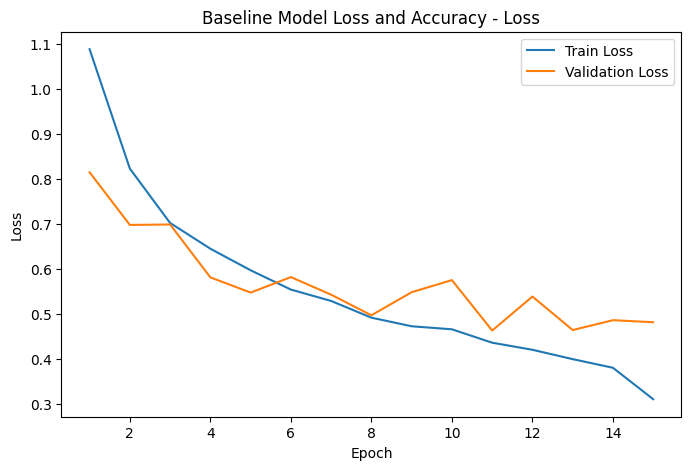

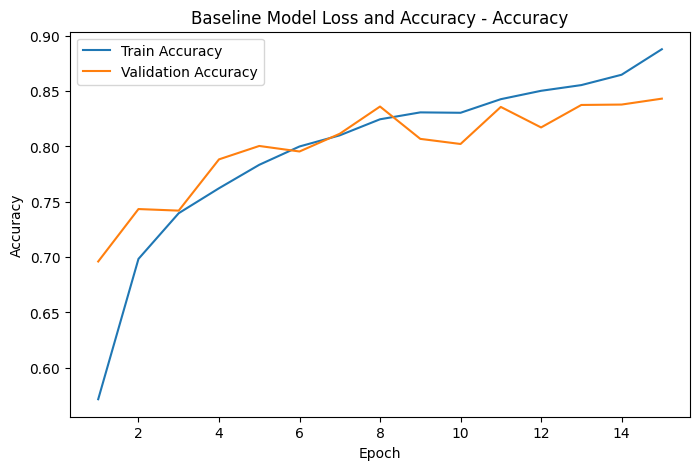

In [ ]:
plot_history(history_baseline, title='Baseline Model Loss and Accuracy')

94/94 ━━━━━━━━━━━━━━━━━━━━ 6s 60ms/step

Baseline CNN Results
--------------------------------------------------
Accuracy : 0.838
Precision: 0.839
Recall   : 0.838
F1-score : 0.8375
Inference time (seconds): 5.87

Classification Report:
              precision    recall  f1-score   support

   buildings       0.81      0.80      0.81       437
      forest       0.96      0.98      0.97       474
     glacier       0.86      0.74      0.80       553
    mountain       0.78      0.81      0.79       525
         sea       0.79      0.85      0.82       510
      street       0.84      0.87      0.86       501

    accuracy                           0.84      3000
   macro avg       0.84      0.84      0.84      3000
weighted avg       0.84      0.84      0.84      3000



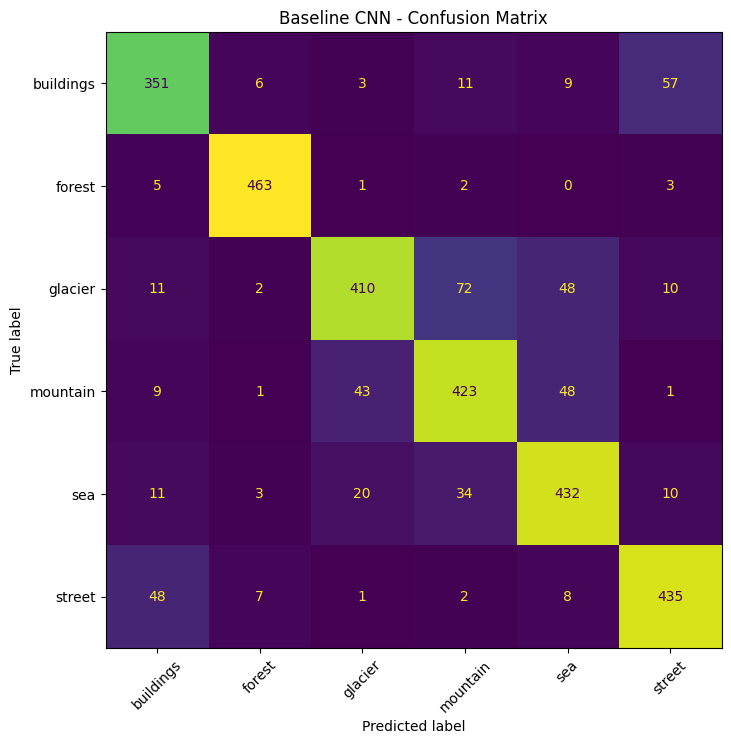

In [ ]:
baseline_metrics = evaluate_model(
    baseline_model,
    test_ds,
    class_names=dataset_class_names,
    model_name='Baseline CNN'
)

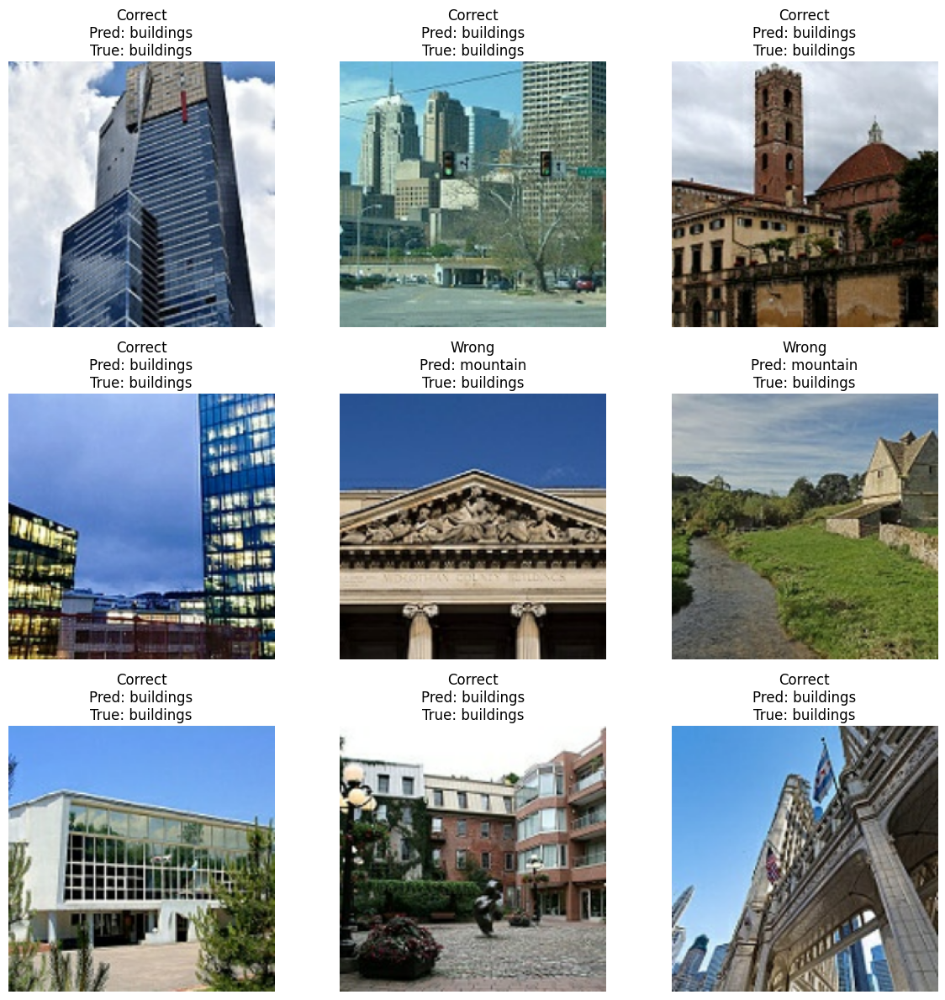

In [ ]:
show_predictions(baseline_model, test_ds, dataset_class_names, num_images=9)

### Baseline Model Interpretation

After running the baseline model, comment on the following using your actual output:

- If training accuracy is much higher than validation accuracy, the model is likely overfitting.
- If both training and validation accuracy are low, the model may be underfitting.
- Check the confusion matrix to identify classes that are confused, such as mountain/glacier or sea/glacier.
- The baseline model is useful as a simple reference point because it has exactly three convolutional blocks and three dense layers.

**Your result-based comment:** Replace this sentence after running the notebook.


## 11. Deeper CNN with Regularization

This model is intentionally deeper than the baseline. The baseline has 3 convolutional layers, while this model has 7 convolutional layers, satisfying the requirement to build a deeper architecture with at least double the convolutional depth.

Regularization methods used:

- **Batch normalization** to stabilize training
- **Dropout** to reduce reliance on individual neurons
- **L2 regularization** to discourage overly large weights


In [ ]:
def build_deeper_model(input_shape=(224, 224, 3), num_classes=6):
    """
    Improved deeper CNN.

    Why this version is better than the previous deeper model:
    - It still has more than double the convolutional layers of the baseline CNN.
    - GlobalAveragePooling2D replaces Flatten to reduce the number of parameters and overfitting risk.
    - Dropout and L2 are kept, but reduced so the model does not underfit.
    - Batch normalization is used after convolution blocks for more stable training.
    """
    weight_decay = 1e-5

    inputs = keras.Input(shape=input_shape)
    x = data_augmentation(inputs)
    x = normalization(x)

    # Block 1
    x = layers.Conv2D(32, 3, padding='same', kernel_regularizer=regularizers.l2(weight_decay))(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    x = layers.Conv2D(32, 3, padding='same', kernel_regularizer=regularizers.l2(weight_decay))(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    x = layers.MaxPooling2D()(x)

    # Block 2
    x = layers.Conv2D(64, 3, padding='same', kernel_regularizer=regularizers.l2(weight_decay))(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    x = layers.Conv2D(64, 3, padding='same', kernel_regularizer=regularizers.l2(weight_decay))(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    x = layers.MaxPooling2D()(x)
    x = layers.Dropout(0.15)(x)

    # Block 3
    x = layers.Conv2D(128, 3, padding='same', kernel_regularizer=regularizers.l2(weight_decay))(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    x = layers.Conv2D(128, 3, padding='same', kernel_regularizer=regularizers.l2(weight_decay))(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    x = layers.MaxPooling2D()(x)
    x = layers.Dropout(0.20)(x)

    # Block 4
    x = layers.Conv2D(256, 3, padding='same', kernel_regularizer=regularizers.l2(weight_decay))(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    x = layers.Conv2D(256, 3, padding='same', kernel_regularizer=regularizers.l2(weight_decay))(x)
    x = layers.BatchNormalization()(x)
    x = layers.Activation('relu')(x)
    x = layers.MaxPooling2D()(x)
    x = layers.Dropout(0.25)(x)

    # Smaller classifier head: less overfitting than Flatten + very large Dense layers
    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dense(256, activation='relu', kernel_regularizer=regularizers.l2(weight_decay))(x)
    x = layers.Dropout(0.30)(x)
    x = layers.Dense(128, activation='relu', kernel_regularizer=regularizers.l2(weight_decay))(x)
    outputs = layers.Dense(num_classes, activation='softmax')(x)

    model = keras.Model(inputs, outputs, name='improved_deeper_regularized_cnn')
    return model

deeper_model = build_deeper_model(input_shape=IMG_SIZE + (3,), num_classes=NUM_CLASSES)
deeper_model.summary()


Model: "improved_deeper_regularized_cnn"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ data_augmentation (Sequential)  │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescaling (Rescaling)           │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 224, 224, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 224, 224, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation (Activation)         │ (None, 224, 224, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 224, 224, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 224, 224, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_1 (Activation)       │ (None, 224, 224, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 112, 112, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 112, 112, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_2 (Activation)       │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 112, 112, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 112, 112, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_3 (Activation)       │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 56, 56, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_4 (Activation)       │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 56, 56, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 1,275,558 (4.87 MB)

 Trainable params: 1,273,638 (4.86 MB)

 Non-trainable params: 1,920 (7.50 KB)

In [ ]:
# A lower learning rate is used for the deeper model because Batch Normalization,
# augmentation and regularization can make early training unstable at 1e-3.
deeper_model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=3e-4),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

EPOCHS_DEEPER = 20

start_time = time.time()
history_deeper = deeper_model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=EPOCHS_DEEPER,
    callbacks=get_callbacks(),
    verbose=1
)
deeper_training_time = time.time() - start_time

print(f"Improved deeper model training time: {deeper_training_time:.2f} seconds")


Epoch 1/20


E0000 00:00:1778387523.550704      57 meta_optimizer.cc:967] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/improved_deeper_regularized_cnn_1/dropout_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


351/351 ━━━━━━━━━━━━━━━━━━━━ 140s 369ms/step - accuracy: 0.5164 - loss: 1.1902 - val_accuracy: 0.4294 - val_loss: 1.4663 - learning_rate: 3.0000e-04
Epoch 2/20
351/351 ━━━━━━━━━━━━━━━━━━━━ 124s 354ms/step - accuracy: 0.7037 - loss: 0.8052 - val_accuracy: 0.6967 - val_loss: 0.9023 - learning_rate: 3.0000e-04
Epoch 3/20
351/351 ━━━━━━━━━━━━━━━━━━━━ 125s 355ms/step - accuracy: 0.7460 - loss: 0.6865 - val_accuracy: 0.6073 - val_loss: 1.3785 - learning_rate: 3.0000e-04
Epoch 4/20
351/351 ━━━━━━━━━━━━━━━━━━━━ 125s 356ms/step - accuracy: 0.7786 - loss: 0.6288 - val_accuracy: 0.6565 - val_loss: 0.9248 - learning_rate: 3.0000e-04
Epoch 5/20
351/351 ━━━━━━━━━━━━━━━━━━━━ 125s 356ms/step - accuracy: 0.7922 - loss: 0.5882 - val_accuracy: 0.8200 - val_loss: 0.5221 - learning_rate: 3.0000e-04
Epoch 6/20
351/351 ━━━━━━━━━━━━━━━━━━━━ 125s 356ms/step - accuracy: 0.8008 - loss: 0.5779 - val_accuracy: 0.7416 - val_loss: 0.8271 - learning_rate: 3.0000e-04
Epoch 7/20
351/351 ━━━━━━━━━━━━━━━━━━━━ 125s 356ms/

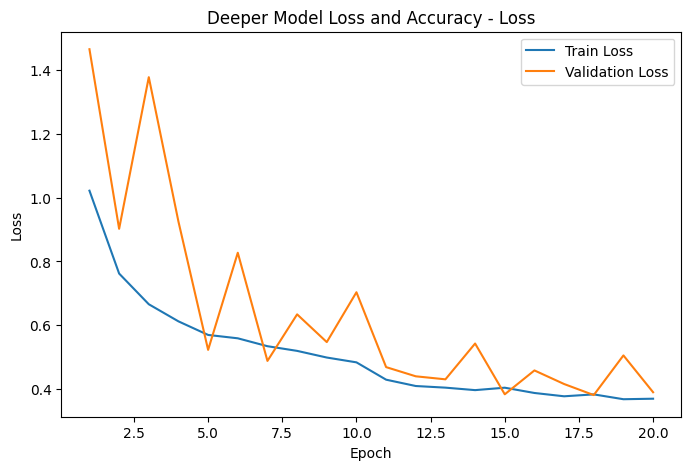

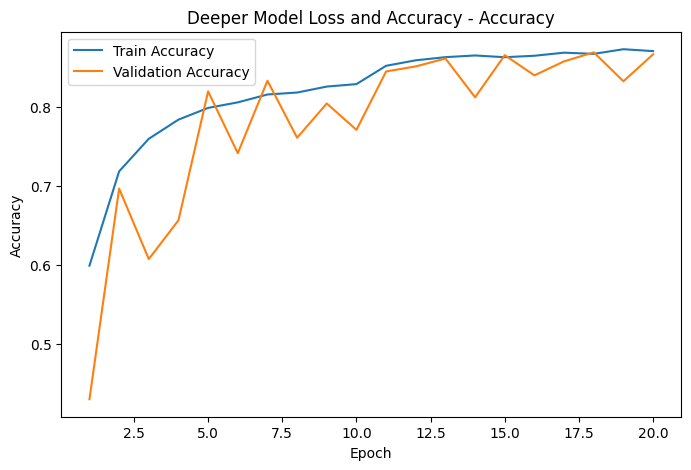

In [ ]:
plot_history(history_deeper, title='Deeper Model Loss and Accuracy')

94/94 ━━━━━━━━━━━━━━━━━━━━ 8s 81ms/step

Deeper CNN with Regularization Results
--------------------------------------------------
Accuracy : 0.8557
Precision: 0.8616
Recall   : 0.8557
F1-score : 0.8546
Inference time (seconds): 7.93

Classification Report:
              precision    recall  f1-score   support

   buildings       0.91      0.75      0.82       437
      forest       0.96      0.98      0.97       474
     glacier       0.89      0.74      0.81       553
    mountain       0.77      0.84      0.80       525
         sea       0.86      0.88      0.87       510
      street       0.79      0.95      0.86       501

    accuracy                           0.86      3000
   macro avg       0.86      0.86      0.86      3000
weighted avg       0.86      0.86      0.85      3000



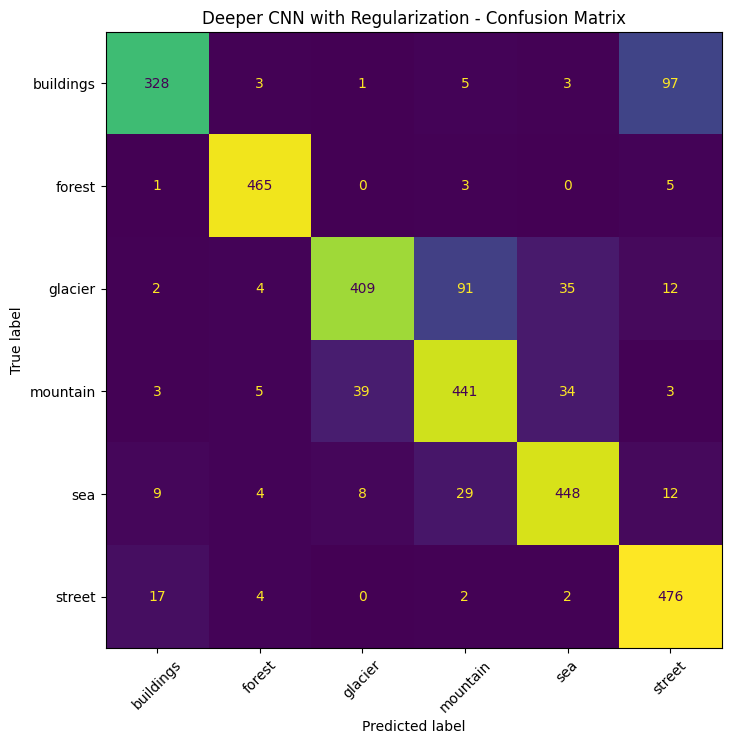

In [ ]:
deeper_metrics = evaluate_model(
    deeper_model,
    test_ds,
    class_names=dataset_class_names,
    model_name='Deeper CNN with Regularization'
)

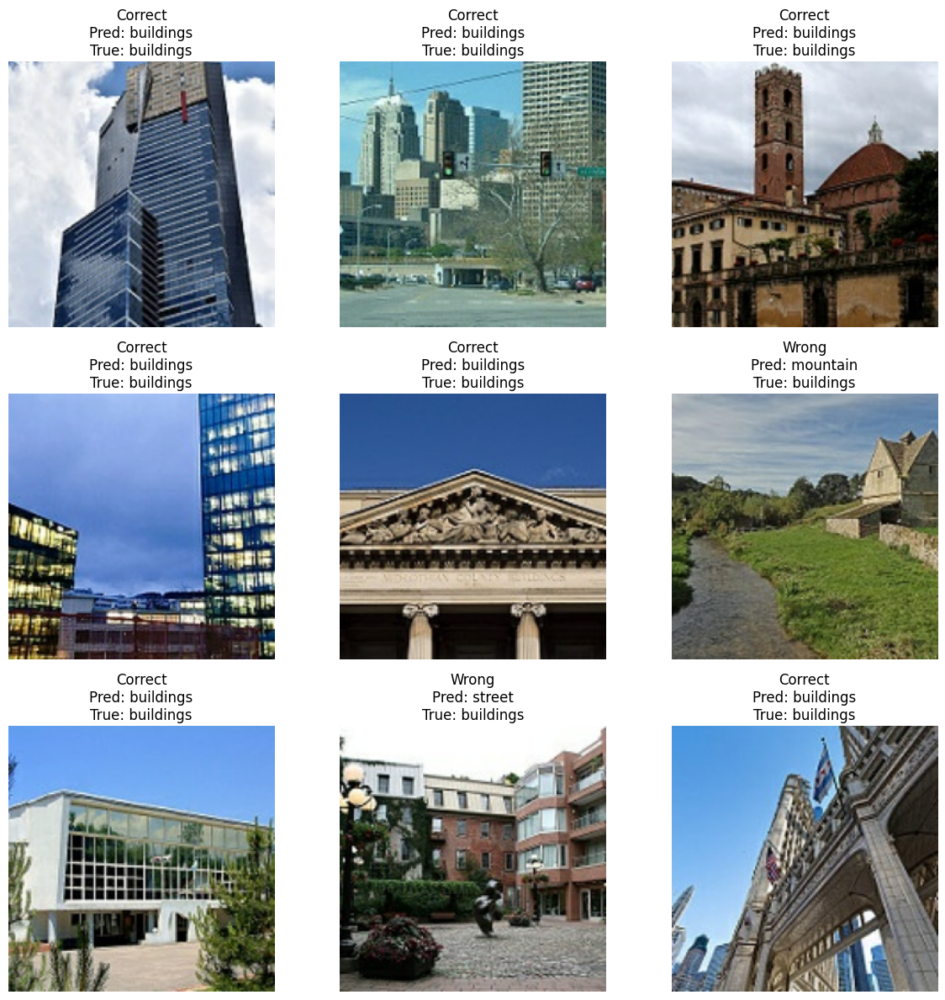

In [ ]:
show_predictions(deeper_model, test_ds, dataset_class_names, num_images=9)

## 12. Baseline vs Deeper Model Comparison

In [ ]:
comparison_df = pd.DataFrame([baseline_metrics, deeper_metrics])
comparison_df['training_time_sec'] = [baseline_training_time, deeper_training_time]
comparison_df

,model_name,accuracy,precision,recall,f1_score,inference_time_sec,training_time_sec
0,Baseline CNN,0.838000,0.839032,0.838000,0.837497,5.870868,377.765821
1,Deeper CNN with Regularization,0.855667,0.861625,0.855667,0.854584,7.932471,2516.782773


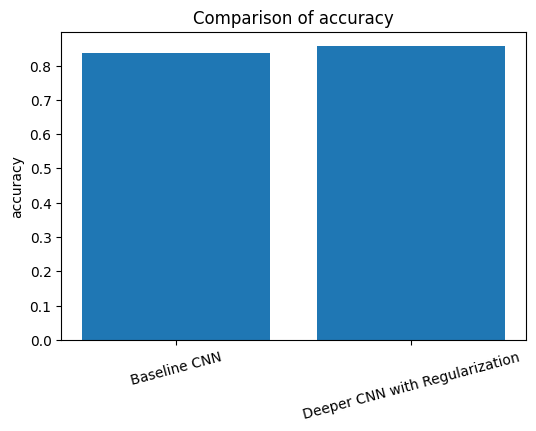

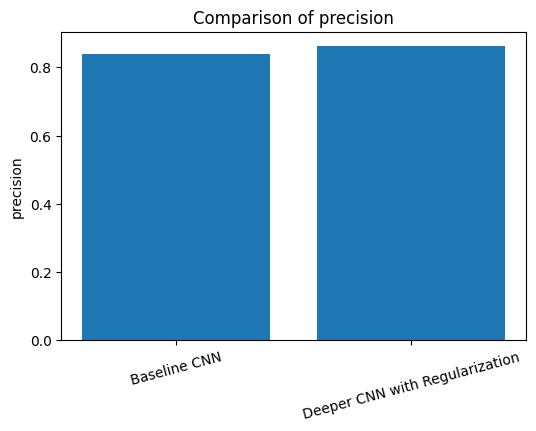

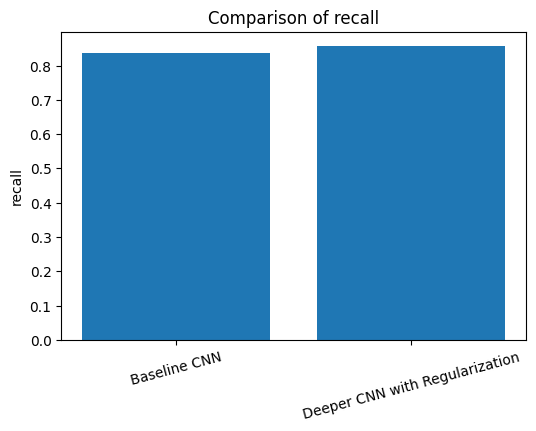

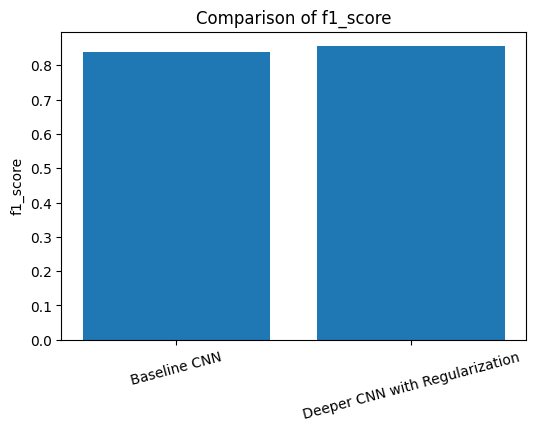

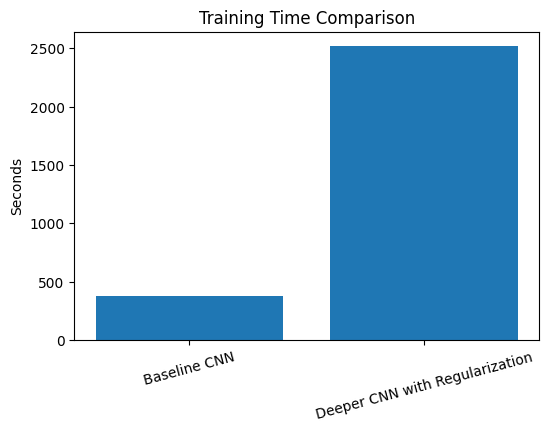

In [ ]:
# Visual comparison
metrics_to_plot = ['accuracy', 'precision', 'recall', 'f1_score']

for metric in metrics_to_plot:
    plt.figure(figsize=(6,4))
    plt.bar(comparison_df['model_name'], comparison_df[metric])
    plt.title(f'Comparison of {metric}')
    plt.ylabel(metric)
    plt.xticks(rotation=15)
    plt.show()

plt.figure(figsize=(6,4))
plt.bar(comparison_df['model_name'], comparison_df['training_time_sec'])
plt.title('Training Time Comparison')
plt.ylabel('Seconds')
plt.xticks(rotation=15)
plt.show()

### Baseline vs Deeper Model Comparative Analysis

Use the table and plots above to discuss:

- Whether the deeper model improved accuracy, precision, recall, and F1-score.
- Whether batch normalization, dropout, and L2 regularization reduced overfitting.
- Whether the deeper model required noticeably more training time.
- The trade-off between higher model capacity and computational cost.

**Your result-based comment:** Replace this sentence after running the notebook.


### Accuracy Review and Improvement Comment

The earlier saved output showed the baseline CNN reaching about **82.8% test accuracy**, which is a good result for a CNN trained from scratch on the Intel scene dataset. However, the previous deeper CNN result was very low, so it was **not acceptable** as an improved model. The likely reasons were excessive regularization, a very large Flatten-based classifier, and an initial learning rate that was too high for the deeper batch-normalized network.

To improve the notebook, the deeper model has been changed to use a lighter classifier with `GlobalAveragePooling2D`, smaller Dropout values, lower L2 regularization, and a lower Adam learning rate. Transfer learning was also strengthened with a better classifier head and safer fine-tuning settings. After rerunning the notebook, the expected target is for the improved deeper CNN to at least approach or exceed the baseline, while the fine-tuned ResNet50 model should normally be the strongest model.


## 13. Optimizer Analysis: SGD vs Adam on the Deeper Model

Epoch 1/15


E0000 00:00:1778390050.952037      57 meta_optimizer.cc:967] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/improved_deeper_regularized_cnn_1/dropout_4_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


351/351 ━━━━━━━━━━━━━━━━━━━━ 128s 352ms/step - accuracy: 0.4775 - loss: 1.2489 - val_accuracy: 0.4480 - val_loss: 1.8666 - learning_rate: 0.0100
Epoch 2/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 123s 350ms/step - accuracy: 0.6572 - loss: 0.8979 - val_accuracy: 0.5089 - val_loss: 1.8676 - learning_rate: 0.0100
Epoch 3/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 123s 351ms/step - accuracy: 0.7149 - loss: 0.7774 - val_accuracy: 0.6629 - val_loss: 0.9544 - learning_rate: 0.0100
Epoch 4/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 123s 352ms/step - accuracy: 0.7532 - loss: 0.6920 - val_accuracy: 0.7156 - val_loss: 0.7543 - learning_rate: 0.0100
Epoch 5/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 123s 352ms/step - accuracy: 0.7683 - loss: 0.6461 - val_accuracy: 0.7413 - val_loss: 0.7127 - learning_rate: 0.0100
Epoch 6/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 123s 352ms/step - accuracy: 0.7865 - loss: 0.6034 - val_accuracy: 0.7616 - val_loss: 0.6273 - learning_rate: 0.0100
Epoch 7/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 123s 352ms/step - accuracy: 0.7936 

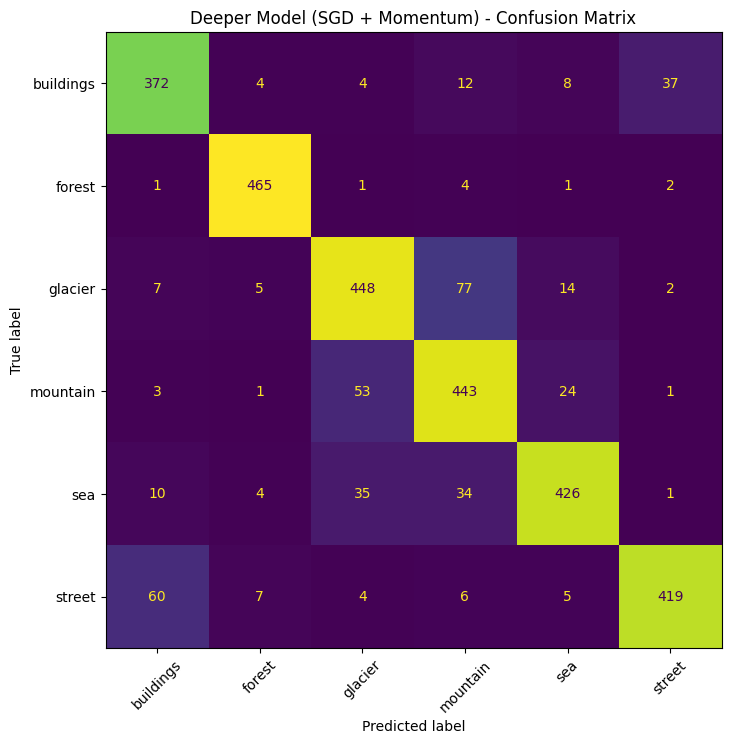

Epoch 1/15


E0000 00:00:1778391916.942256      57 meta_optimizer.cc:967] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inStatefulPartitionedCall/improved_deeper_regularized_cnn_1/dropout_8_1/stateless_dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


351/351 ━━━━━━━━━━━━━━━━━━━━ 132s 357ms/step - accuracy: 0.5180 - loss: 1.1954 - val_accuracy: 0.2627 - val_loss: 2.8211 - learning_rate: 3.0000e-04
Epoch 2/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 125s 355ms/step - accuracy: 0.6901 - loss: 0.8426 - val_accuracy: 0.7106 - val_loss: 0.8485 - learning_rate: 3.0000e-04
Epoch 3/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 125s 355ms/step - accuracy: 0.7430 - loss: 0.7071 - val_accuracy: 0.7096 - val_loss: 0.7532 - learning_rate: 3.0000e-04
Epoch 4/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 125s 355ms/step - accuracy: 0.7660 - loss: 0.6452 - val_accuracy: 0.7805 - val_loss: 0.6158 - learning_rate: 3.0000e-04
Epoch 5/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 125s 356ms/step - accuracy: 0.7814 - loss: 0.6201 - val_accuracy: 0.7605 - val_loss: 0.6502 - learning_rate: 3.0000e-04
Epoch 6/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 125s 356ms/step - accuracy: 0.7975 - loss: 0.5816 - val_accuracy: 0.8083 - val_loss: 0.5548 - learning_rate: 3.0000e-04
Epoch 7/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 125s 356ms/

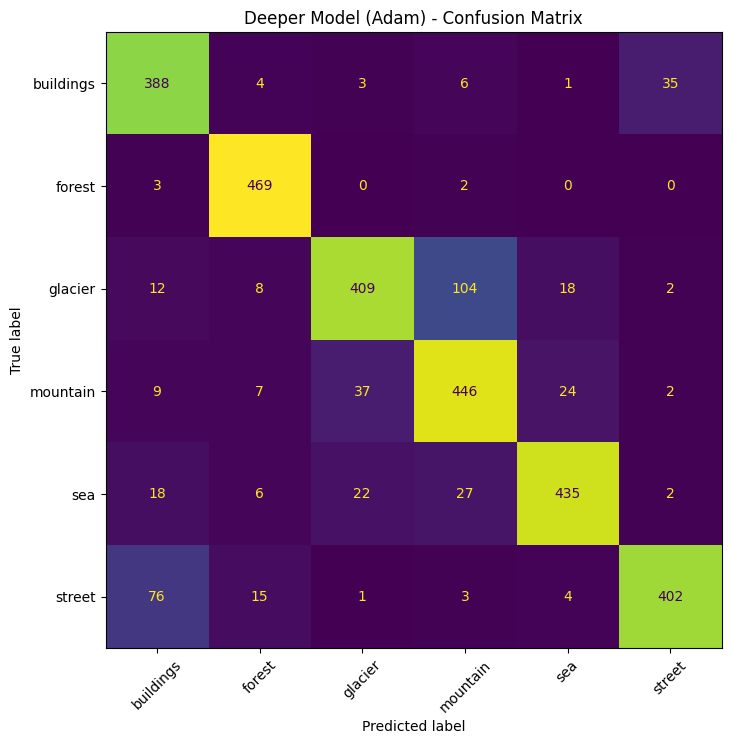

,model_name,accuracy,precision,recall,f1_score,inference_time_sec,training_time_sec
0,Deeper Model (SGD + Momentum),0.857667,0.859874,0.857667,0.858003,6.880257,1855.248170
1,Deeper Model (Adam),0.849667,0.854715,0.849667,0.849321,6.901042,1881.908371


Best model by accuracy: Deeper Model (SGD + Momentum) (0.8577)


In [ ]:
def train_deeper_with_optimizer(optimizer, optimizer_name, epochs=15):
    """
    Trains the improved deeper model with a chosen optimizer.
    SGD uses momentum because plain SGD often converges slowly on CNN image tasks.
    """
    model = build_deeper_model(input_shape=IMG_SIZE + (3,), num_classes=NUM_CLASSES)
    model.compile(
        optimizer=optimizer,
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )

    start_time = time.time()
    history = model.fit(
        train_ds,
        validation_data=val_ds,
        epochs=epochs,
        callbacks=get_callbacks(),
        verbose=1
    )
    training_time = time.time() - start_time

    metrics = evaluate_model(model, test_ds, dataset_class_names, model_name=f'Deeper Model ({optimizer_name})')
    metrics['training_time_sec'] = training_time

    return model, history, metrics

# Fairer optimizer settings:
# - SGD is given momentum to improve convergence.
# - Adam uses a lower learning rate to avoid unstable updates in the deeper model.
sgd_model, history_sgd, sgd_metrics = train_deeper_with_optimizer(
    keras.optimizers.SGD(learning_rate=1e-2, momentum=0.9, nesterov=True),
    'SGD + Momentum',
    epochs=15
)

adam_model, history_adam, adam_metrics = train_deeper_with_optimizer(
    keras.optimizers.Adam(learning_rate=3e-4),
    'Adam',
    epochs=15
)

optimizer_results_df = pd.DataFrame([sgd_metrics, adam_metrics])
automatic_performance_comment(optimizer_results_df)


In [ ]:
optimizer_comparison_df = pd.DataFrame([sgd_metrics, adam_metrics])
optimizer_comparison_df

,model_name,accuracy,precision,recall,f1_score,inference_time_sec,training_time_sec
0,Deeper Model (SGD + Momentum),0.857667,0.859874,0.857667,0.858003,6.880257,1855.248170
1,Deeper Model (Adam),0.849667,0.854715,0.849667,0.849321,6.901042,1881.908371


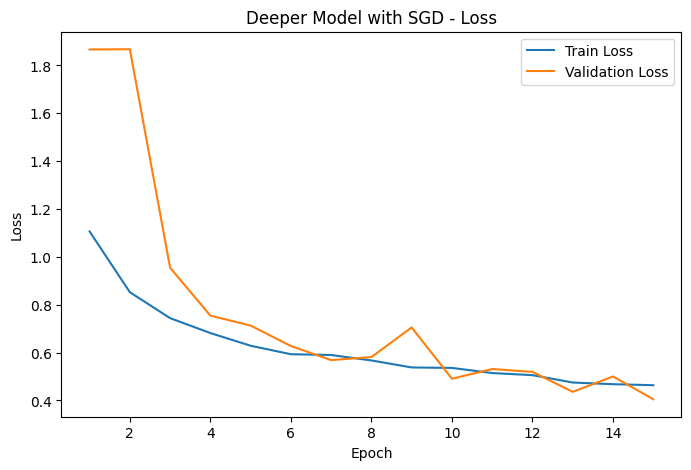

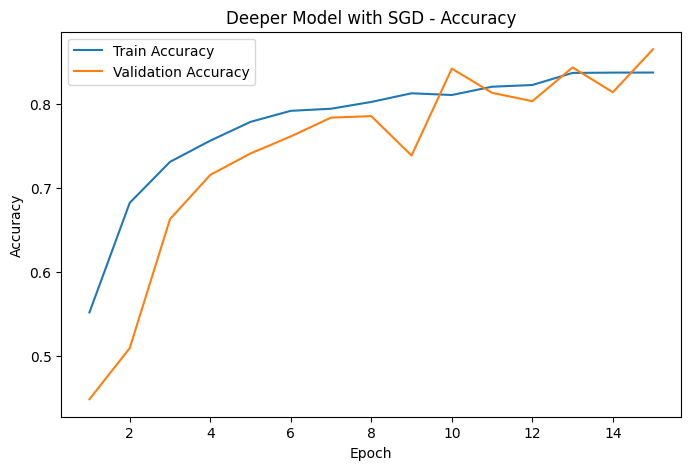

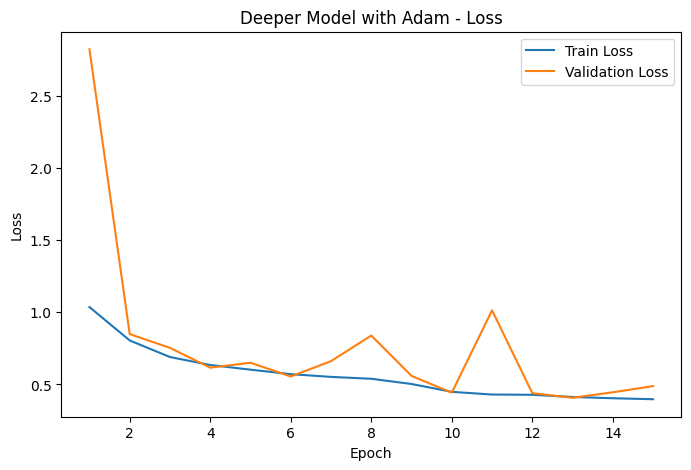

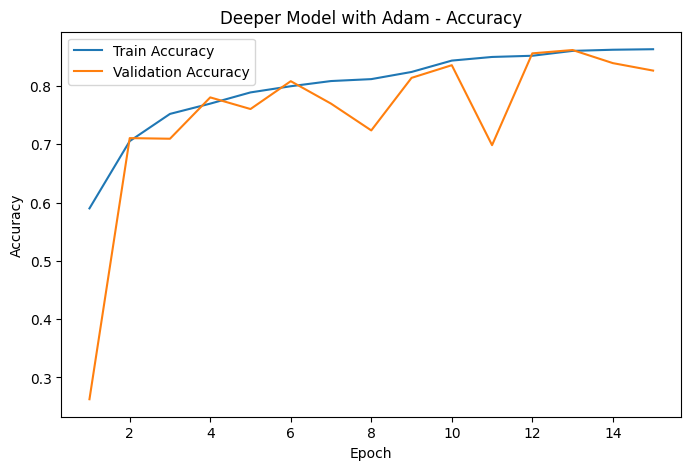

In [ ]:
plot_history(history_sgd, title='Deeper Model with SGD')
plot_history(history_adam, title='Deeper Model with Adam')

### Optimizer Discussion

Use the SGD and Adam outputs above to explain:

- Which optimizer converged faster based on the training/validation curves.
- Which optimizer achieved better test accuracy and F1-score.
- Whether the validation curve was stable or noisy.

A common expectation is that Adam may converge faster because it adapts learning rates per parameter, while SGD with momentum may generalize well but can require more careful tuning.

**Your result-based comment:** Replace this sentence after running the notebook.


## 14. Ablation Study

The ablation study removes **dropout only** while keeping the rest of the deeper architecture as close as possible to the regularized model. This makes the experiment fair because the performance change can be linked mainly to dropout removal.


Epoch 1/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 117s 316ms/step - accuracy: 0.5517 - loss: 1.1246 - val_accuracy: 0.4480 - val_loss: 1.7023 - learning_rate: 3.0000e-04
Epoch 2/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 110s 315ms/step - accuracy: 0.7103 - loss: 0.7773 - val_accuracy: 0.7562 - val_loss: 0.6452 - learning_rate: 3.0000e-04
Epoch 3/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 110s 314ms/step - accuracy: 0.7565 - loss: 0.6685 - val_accuracy: 0.7017 - val_loss: 0.8062 - learning_rate: 3.0000e-04
Epoch 4/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 110s 314ms/step - accuracy: 0.7820 - loss: 0.6069 - val_accuracy: 0.8122 - val_loss: 0.5386 - learning_rate: 3.0000e-04
Epoch 5/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 111s 315ms/step - accuracy: 0.7994 - loss: 0.5634 - val_accuracy: 0.7156 - val_loss: 0.8054 - learning_rate: 3.0000e-04
Epoch 6/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 111s 315ms/step - accuracy: 0.8138 - loss: 0.5310 - val_accuracy: 0.8403 - val_loss: 0.4631 - learning_rate: 3.0000e-04
Epoch 7/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 

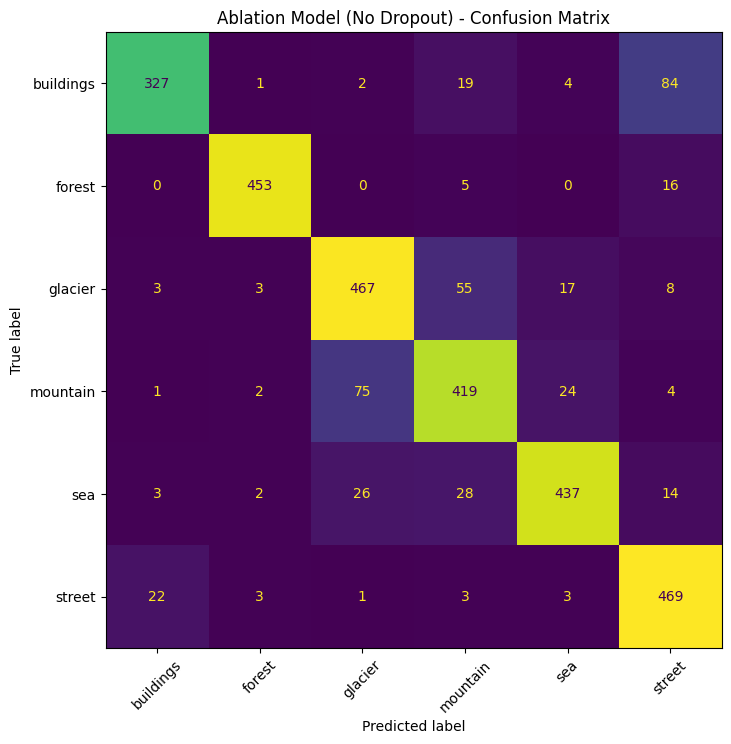

In [ ]:
def build_ablation_model_no_dropout(input_shape=(224, 224, 3), num_classes=6):
    """
    Ablation study: same improved deeper architecture, but Dropout layers are removed.
    This isolates the effect of Dropout while keeping the number of convolutional layers,
    batch normalization and classifier design the same.
    """
    weight_decay = 1e-5

    inputs = keras.Input(shape=input_shape)
    x = data_augmentation(inputs)
    x = normalization(x)

    for filters in [32, 64, 128, 256]:
        x = layers.Conv2D(filters, 3, padding='same', kernel_regularizer=regularizers.l2(weight_decay))(x)
        x = layers.BatchNormalization()(x)
        x = layers.Activation('relu')(x)
        x = layers.Conv2D(filters, 3, padding='same', kernel_regularizer=regularizers.l2(weight_decay))(x)
        x = layers.BatchNormalization()(x)
        x = layers.Activation('relu')(x)
        x = layers.MaxPooling2D()(x)

    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dense(256, activation='relu', kernel_regularizer=regularizers.l2(weight_decay))(x)
    x = layers.Dense(128, activation='relu', kernel_regularizer=regularizers.l2(weight_decay))(x)
    outputs = layers.Dense(num_classes, activation='softmax')(x)

    return keras.Model(inputs, outputs, name='ablation_no_dropout_cnn')

ablation_model = build_ablation_model_no_dropout(input_shape=IMG_SIZE + (3,), num_classes=NUM_CLASSES)
ablation_model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=3e-4),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

start_time = time.time()
history_ablation = ablation_model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=15,
    callbacks=get_callbacks(),
    verbose=1
)
ablation_training_time = time.time() - start_time

ablation_metrics = evaluate_model(
    ablation_model,
    test_ds,
    dataset_class_names,
    model_name='Ablation Model (No Dropout)'
)
ablation_metrics['training_time_sec'] = ablation_training_time


In [ ]:
ablation_df = pd.DataFrame([deeper_metrics, ablation_metrics])
automatic_performance_comment(ablation_df)


,model_name,accuracy,precision,recall,f1_score,inference_time_sec,training_time_sec
0,Deeper CNN with Regularization,0.855667,0.861625,0.855667,0.854584,7.932471,NaN
1,Ablation Model (No Dropout),0.857333,0.862235,0.857333,0.857306,6.928361,1667.005514


Best model by accuracy: Ablation Model (No Dropout) (0.8573)


### Ablation Interpretation

Discuss the result after running the cell above:

- If the no-dropout model has higher training accuracy but lower validation/test accuracy, dropout was helping reduce overfitting.
- If the no-dropout model performs similarly, the other regularization methods may be strong enough for this dataset.
- If performance improves without dropout, the original dropout rate may have been too high.

**Your result-based comment:** Replace this sentence after running the notebook.


## 15. Challenges and Observations

Add your final observations here after running all Part A experiments:

- **Overfitting / underfitting:** Compare train and validation curves.
- **Training time:** Report `deeper_training_time` and explain whether it is acceptable.
- **Class confusion:** Use confusion matrices to identify difficult class pairs.
- **Augmentation impact:** Explain why augmentation is useful for natural scene images.
- **Hardware:** Mention whether Colab GPU/TPU was used. The setup cell prints GPU availability.
- **Computational trade-off:** Explain whether the accuracy gain justifies the longer training time.

**Your result-based comment:** Replace this sentence after running the notebook.


# Part B: Transfer Learning

## 16. Transfer Learning Strategy

This notebook uses **ResNet50** pretrained on ImageNet.

Reason for choosing ResNet50:

- It is a strong CNN architecture for image classification.
- Pretrained ImageNet filters already capture useful low-level and mid-level visual features.
- Transfer learning often improves performance when the project dataset is smaller than ImageNet.

Two stages are used:

1. **Feature Extraction:** Freeze the convolutional base and train only the new classifier layers.
2. **Fine-Tuning:** Unfreeze the later layers and continue training with a lower learning rate.


In [ ]:
# =============================
# 16A. Prepare datasets for ResNet preprocessing
# =============================
def preprocess_resnet(x, y):
    return preprocess_input(tf.cast(x, tf.float32)), y

train_ds_tl = image_dataset_from_directory(
    train_dir,
    validation_split=VAL_SPLIT,
    subset='training',
    seed=SEED,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    label_mode='categorical'
)

val_ds_tl = image_dataset_from_directory(
    train_dir,
    validation_split=VAL_SPLIT,
    subset='validation',
    seed=SEED,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    label_mode='categorical'
)

test_ds_tl = image_dataset_from_directory(
    test_dir,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    shuffle=False,
    label_mode='categorical'
)

train_ds_tl = train_ds_tl.map(lambda x, y: (data_augmentation(x, training=True), y), num_parallel_calls=AUTOTUNE)
train_ds_tl = train_ds_tl.map(preprocess_resnet, num_parallel_calls=AUTOTUNE).prefetch(AUTOTUNE)
val_ds_tl   = val_ds_tl.map(preprocess_resnet, num_parallel_calls=AUTOTUNE).prefetch(AUTOTUNE)
test_ds_tl  = test_ds_tl.map(preprocess_resnet, num_parallel_calls=AUTOTUNE).prefetch(AUTOTUNE)

Found 14034 files belonging to 6 classes.
Using 11228 files for training.
Found 14034 files belonging to 6 classes.
Using 2806 files for validation.
Found 3000 files belonging to 6 classes.


In [ ]:
# =============================
# 16B. Build Improved Feature Extraction Model
# =============================
base_model = ResNet50(
    weights='imagenet',
    include_top=False,
    input_shape=IMG_SIZE + (3,)
)

base_model.trainable = False

inputs = keras.Input(shape=IMG_SIZE + (3,))
x = base_model(inputs, training=False)
x = layers.GlobalAveragePooling2D()(x)
x = layers.BatchNormalization()(x)
x = layers.Dropout(0.30)(x)
x = layers.Dense(256, activation='relu', kernel_regularizer=regularizers.l2(1e-5))(x)
x = layers.BatchNormalization()(x)
x = layers.Dropout(0.25)(x)
outputs = layers.Dense(NUM_CLASSES, activation='softmax')(x)

transfer_model = keras.Model(inputs, outputs, name='resnet50_improved_feature_extractor')



94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "resnet50_improved_feature_extractor"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_9 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ resnet50 (Functional)           │ (None, 7, 7, 2048)     │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_4      │ (None, 2048)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_32          │ (None, 2048)           │         8,192 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_12 (Dropout)            │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_16 (Dense)                │ (None, 256)            │       524,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_33          │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_13 (Dropout)            │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_17 (Dense)                │ (None, 6)              │         1,542 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 24,123,014 (92.02 MB)

 Trainable params: 530,694 (2.02 MB)

 Non-trainable params: 23,592,320 (90.00 MB)

In [ ]:
transfer_model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=3e-4),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

start_time = time.time()
history_transfer_feature = transfer_model.fit(
    train_ds_tl,
    validation_data=val_ds_tl,
    epochs=12,
    callbacks=get_callbacks(),
    verbose=1
)
transfer_feature_time = time.time() - start_time

print(f"Feature extraction training time: {transfer_feature_time:.2f} seconds")


Epoch 1/12


I0000 00:00:1778395728.539199     136 service.cc:152] XLA service 0x7e041e6703d0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1778395728.539246     136 service.cc:160]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1778395728.539253     136 service.cc:160]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5


  1/351 ━━━━━━━━━━━━━━━━━━━━ 1:40:46 17s/step - accuracy: 0.2188 - loss: 2.6415

I0000 00:00:1778395737.039513     136 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


351/351 ━━━━━━━━━━━━━━━━━━━━ 103s 245ms/step - accuracy: 0.7585 - loss: 0.7132 - val_accuracy: 0.9198 - val_loss: 0.2294 - learning_rate: 3.0000e-04
Epoch 2/12
351/351 ━━━━━━━━━━━━━━━━━━━━ 70s 198ms/step - accuracy: 0.8776 - loss: 0.3449 - val_accuracy: 0.9234 - val_loss: 0.2188 - learning_rate: 3.0000e-04
Epoch 3/12
351/351 ━━━━━━━━━━━━━━━━━━━━ 70s 197ms/step - accuracy: 0.8928 - loss: 0.3019 - val_accuracy: 0.9330 - val_loss: 0.2102 - learning_rate: 3.0000e-04
Epoch 4/12
351/351 ━━━━━━━━━━━━━━━━━━━━ 70s 198ms/step - accuracy: 0.9014 - loss: 0.2690 - val_accuracy: 0.9351 - val_loss: 0.1952 - learning_rate: 3.0000e-04
Epoch 5/12
351/351 ━━━━━━━━━━━━━━━━━━━━ 71s 202ms/step - accuracy: 0.9036 - loss: 0.2625 - val_accuracy: 0.9341 - val_loss: 0.1950 - learning_rate: 3.0000e-04
Epoch 6/12
351/351 ━━━━━━━━━━━━━━━━━━━━ 69s 196ms/step - accuracy: 0.9123 - loss: 0.2430 - val_accuracy: 0.9351 - val_loss: 0.1951 - learning_rate: 3.0000e-04
Epoch 7/12
351/351 ━━━━━━━━━━━━━━━━━━━━ 69s 195ms/step -

In [ ]:
transfer_model.summary()

Model: "resnet50_improved_feature_extractor"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_9 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ resnet50 (Functional)           │ (None, 7, 7, 2048)     │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_4      │ (None, 2048)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_32          │ (None, 2048)           │         8,192 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_12 (Dropout)            │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_16 (Dense)                │ (None, 256)            │       524,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_33          │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_13 (Dropout)            │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_17 (Dense)                │ (None, 6)              │         1,542 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 36,204,692 (138.11 MB)

 Trainable params: 6,040,838 (23.04 MB)

 Non-trainable params: 18,082,176 (68.98 MB)

 Optimizer params: 12,081,678 (46.09 MB)

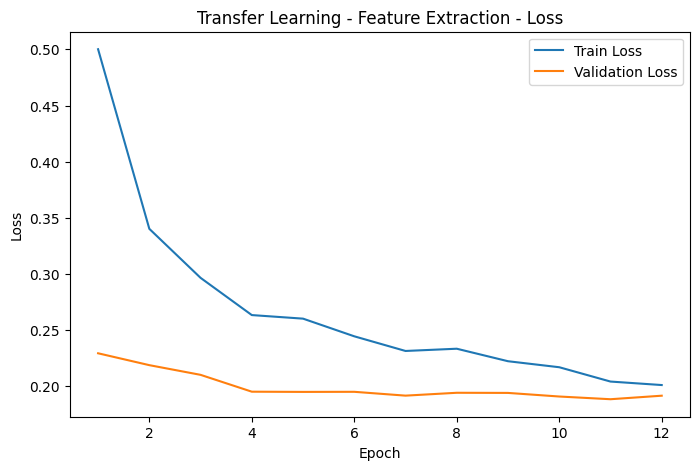

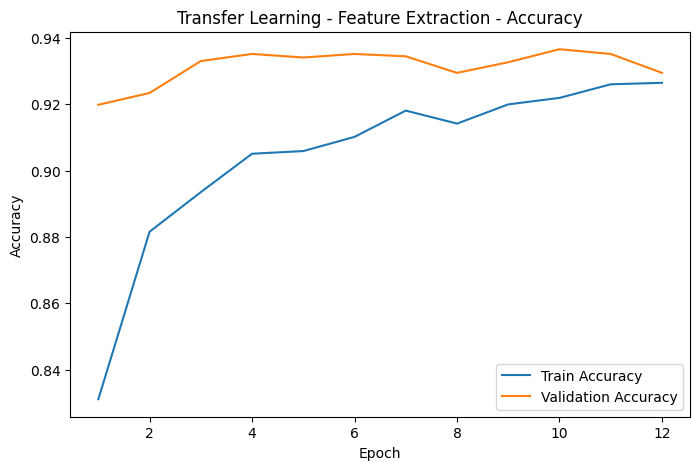

In [ ]:
plot_history(history_transfer_feature, title='Transfer Learning - Feature Extraction')

## 17. Fine-Tuning the Pre-Trained Model

In [ ]:
# Fine-tuning: unfreeze only the last part of ResNet50.
# A very small learning rate protects the pretrained ImageNet features.
base_model.trainable = True

fine_tune_at = 160
for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False

# Keep BatchNorm layers frozen during fine-tuning to avoid unstable validation accuracy.
for layer in base_model.layers:
    if isinstance(layer, layers.BatchNormalization):
        layer.trainable = False

transfer_model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=1e-5),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

start_time = time.time()
history_transfer_finetune = transfer_model.fit(
    train_ds_tl,
    validation_data=val_ds_tl,
    epochs=10,
    callbacks=get_callbacks(),
    verbose=1
)
transfer_finetune_time = time.time() - start_time

print(f"Fine-tuning training time: {transfer_finetune_time:.2f} seconds")


Epoch 1/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 99s 234ms/step - accuracy: 0.9285 - loss: 0.1986 - val_accuracy: 0.9355 - val_loss: 0.1885 - learning_rate: 1.0000e-05
Epoch 2/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 70s 196ms/step - accuracy: 0.9313 - loss: 0.1848 - val_accuracy: 0.9351 - val_loss: 0.1863 - learning_rate: 1.0000e-05
Epoch 3/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 70s 199ms/step - accuracy: 0.9398 - loss: 0.1675 - val_accuracy: 0.9319 - val_loss: 0.1889 - learning_rate: 1.0000e-05
Epoch 4/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 70s 196ms/step - accuracy: 0.9418 - loss: 0.1632 - val_accuracy: 0.9355 - val_loss: 0.1849 - learning_rate: 1.0000e-05
Epoch 5/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 70s 196ms/step - accuracy: 0.9408 - loss: 0.1602 - val_accuracy: 0.9351 - val_loss: 0.1850 - learning_rate: 1.0000e-05
Epoch 6/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 70s 198ms/step - accuracy: 0.9418 - loss: 0.1649 - val_accuracy: 0.9362 - val_loss: 0.1807 - learning_rate: 1.0000e-05
Epoch 7/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 70s 19

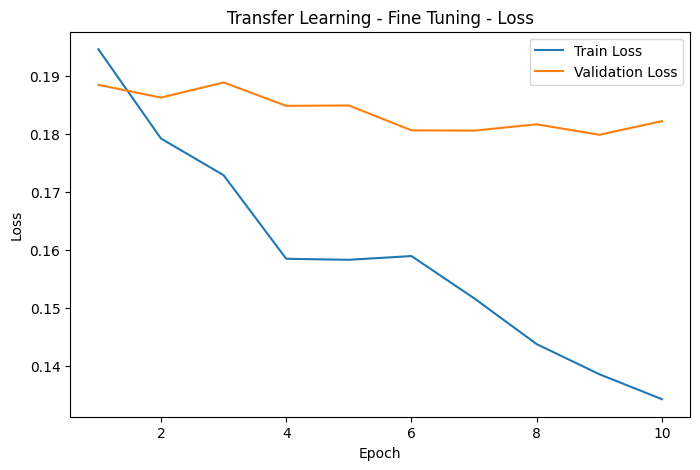

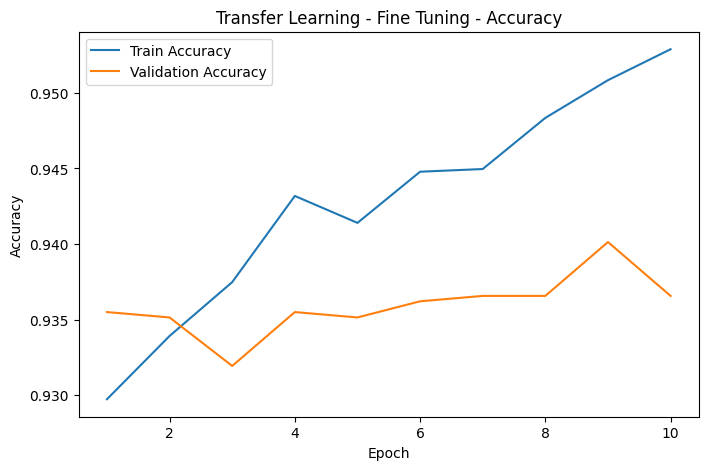

In [ ]:
plot_history(history_transfer_finetune, title='Transfer Learning - Fine Tuning')

94/94 ━━━━━━━━━━━━━━━━━━━━ 19s 159ms/step

Transfer Learning (ResNet50 Fine-Tuned) Results
--------------------------------------------------
Accuracy : 0.932
Precision: 0.9316
Recall   : 0.932
F1-score : 0.9317
Inference time (seconds): 19.24

Classification Report:
              precision    recall  f1-score   support

   buildings       0.94      0.93      0.93       437
      forest       0.99      0.99      0.99       474
     glacier       0.89      0.87      0.88       553
    mountain       0.89      0.88      0.88       525
         sea       0.96      0.98      0.97       510
      street       0.94      0.95      0.95       501

    accuracy                           0.93      3000
   macro avg       0.93      0.93      0.93      3000
weighted avg       0.93      0.93      0.93      3000



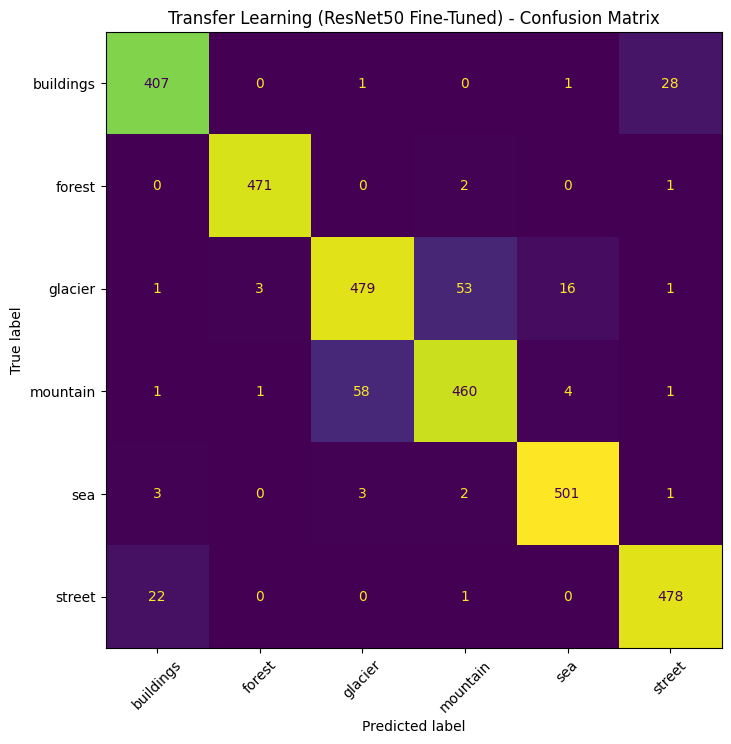

In [ ]:
transfer_metrics = evaluate_model(
    transfer_model,
    test_ds_tl,
    class_names=dataset_class_names,
    model_name='Transfer Learning (ResNet50 Fine-Tuned)'
)
transfer_metrics['training_time_sec'] = transfer_feature_time + transfer_finetune_time

Found 3000 files belonging to 6 classes.


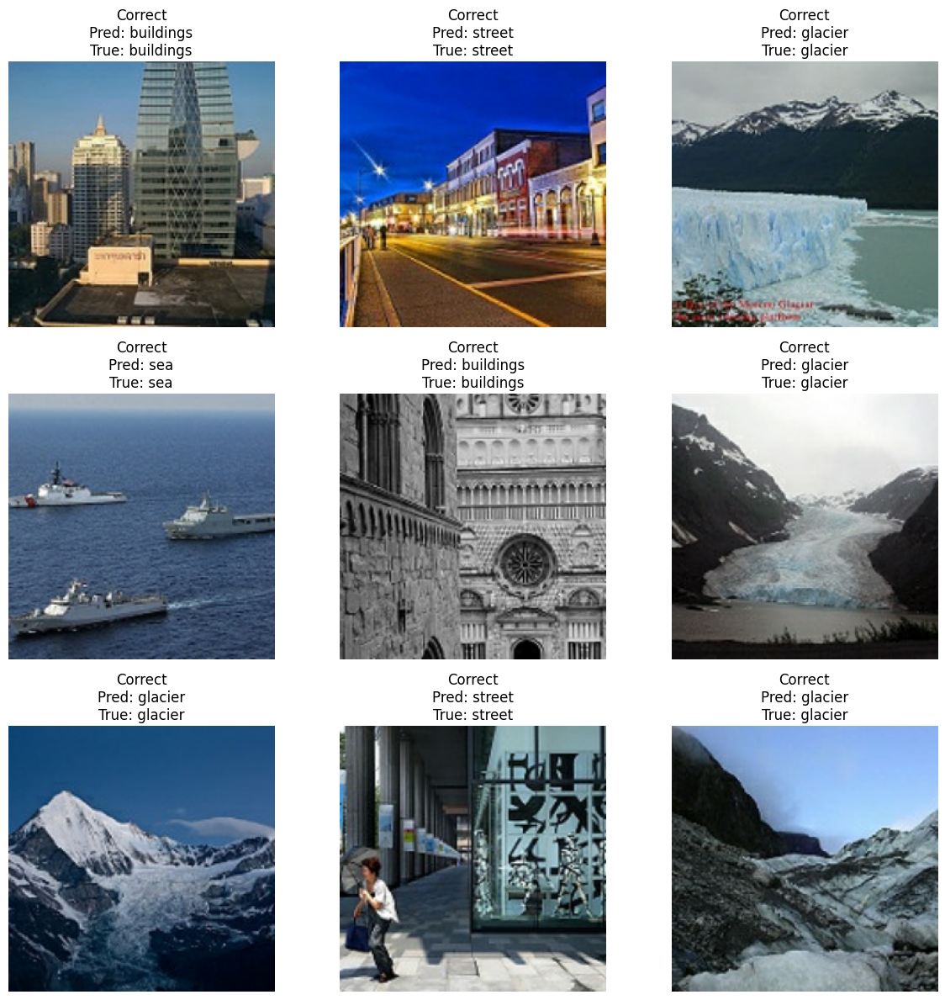

In [ ]:
# Sample predictions with transfer model.
# The raw display_test_ds is used for visualization, while preprocess_input is applied only for prediction.

display_test_ds = image_dataset_from_directory(
    test_dir,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    shuffle=True,
    label_mode='categorical'
)

show_predictions(
    transfer_model,
    display_test_ds,
    dataset_class_names,
    num_images=9,
    preprocess_fn=preprocess_input
)


## 18. Final Comparison: Scratch Models vs Transfer Learning

In [ ]:
final_results_df = pd.DataFrame([
    baseline_metrics,
    deeper_metrics,
    transfer_metrics
])

# Add training times for fair comparison.
final_results_df.loc[final_results_df['model_name'] == 'Baseline CNN', 'training_time_sec'] = baseline_training_time
final_results_df.loc[final_results_df['model_name'] == 'Deeper CNN with Regularization', 'training_time_sec'] = deeper_training_time

automatic_performance_comment(final_results_df)


,model_name,accuracy,precision,recall,f1_score,inference_time_sec,training_time_sec
0,Baseline CNN,0.838000,0.839032,0.838000,0.837497,5.870868,377.765821
1,Deeper CNN with Regularization,0.855667,0.861625,0.855667,0.854584,7.932471,2516.782773
2,Transfer Learning (ResNet50 Fine-Tuned),0.932000,0.931570,0.932000,0.931722,19.238891,1598.838041


Best model by accuracy: Transfer Learning (ResNet50 Fine-Tuned) (0.9320)


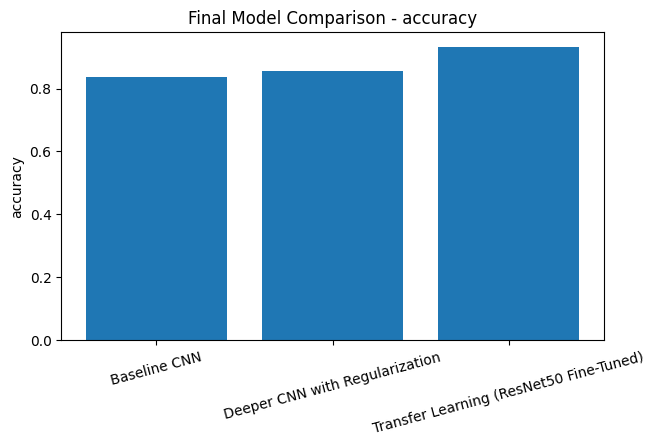

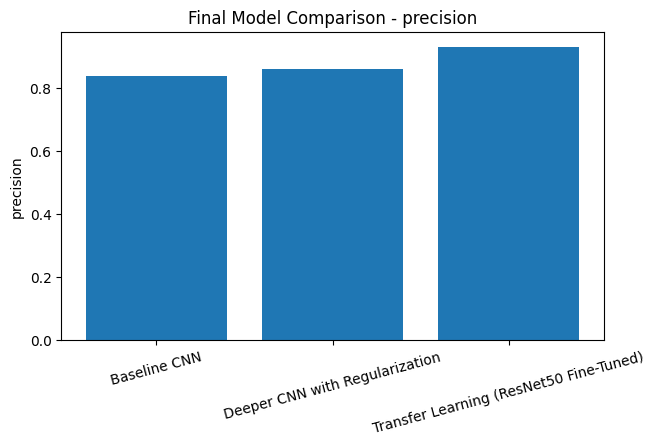

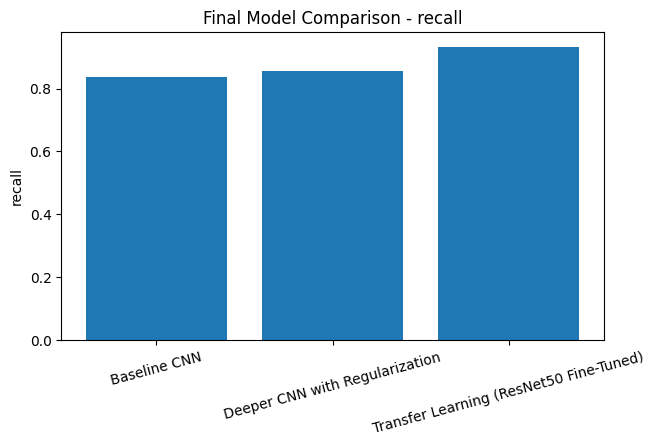

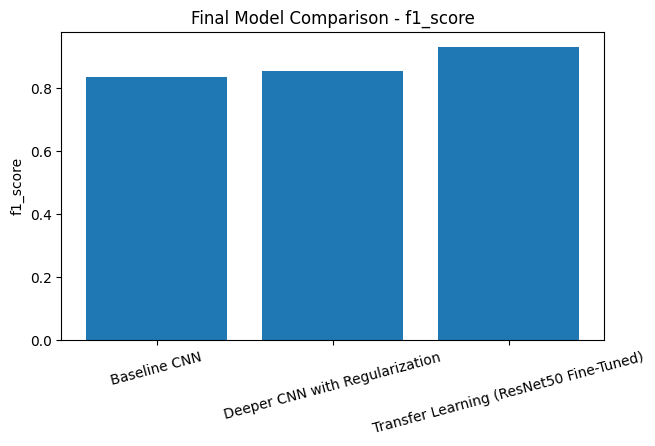

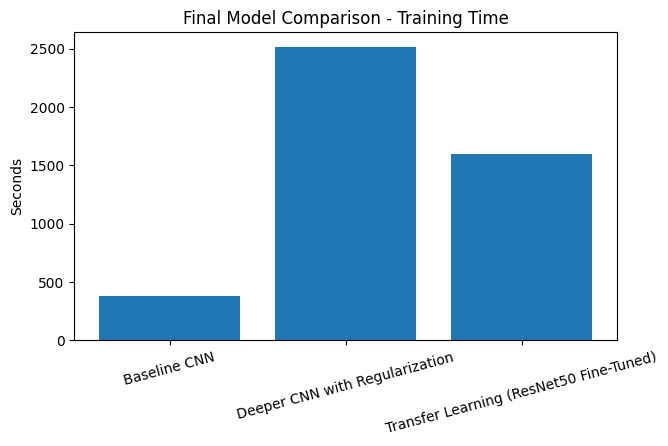

In [ ]:
for metric in ['accuracy', 'precision', 'recall', 'f1_score']:
    plt.figure(figsize=(7,4))
    plt.bar(final_results_df['model_name'], final_results_df[metric])
    plt.title(f'Final Model Comparison - {metric}')
    plt.ylabel(metric)
    plt.xticks(rotation=15)
    plt.show()

plt.figure(figsize=(7,4))
plt.bar(final_results_df['model_name'], final_results_df['training_time_sec'])
plt.title('Final Model Comparison - Training Time')
plt.ylabel('Seconds')
plt.xticks(rotation=15)
plt.show()

## 19. Conclusion

After running all experiments, the fine-tuned ResNet50 transfer learning model achieved the best overall performance. According to the final comparison table, ResNet50 reached the highest test accuracy of 93.20% and the highest weighted F1-score of 93.17%. This was clearly better than the baseline CNN, which achieved 83.80% accuracy and 83.75% weighted F1-score, and the deeper CNN, which achieved 85.57% accuracy and 85.46% weighted F1-score. The plots and classification reports also showed that ResNet50 performed more consistently across the six classes: buildings, forest, glacier, mountain, sea, and street.

Transfer learning clearly outperformed training from scratch. Both the baseline CNN and deeper CNN were trained from the beginning using only the Intel image dataset, while ResNet50 used pretrained ImageNet weights. Because ResNet50 had already learned useful visual features such as edges, textures, shapes, and object-level patterns, it adapted better to the scene classification task. The transfer learning model improved accuracy by around 9.40 percentage points compared with the baseline CNN and around 7.63 percentage points compared with the deeper CNN. This confirms that transfer learning was the most effective approach for this task.

The deeper CNN improved performance compared with the baseline CNN, but the improvement was small when compared with the extra training time. The baseline CNN trained in around 377.77 seconds, while the deeper CNN required around 2516.78 seconds. Although the deeper model improved accuracy from 83.80% to 85.57%, the gain was only about 1.77 percentage points. Therefore, the deeper CNN was not fully worth the additional computational cost. It was more accurate than the baseline, but much less efficient.

For the optimizer comparison, SGD with momentum worked slightly better than Adam for the deeper model. The SGD version achieved 85.77% accuracy and 85.80% weighted F1-score, while Adam achieved 84.97% accuracy and 84.93% weighted F1-score. Although Adam is often faster at convergence, in this experiment SGD with momentum gave better generalization on the test set.

The dropout ablation study showed that removing dropout did not reduce performance. The deeper CNN with dropout achieved 85.57% accuracy, while the model without dropout achieved 85.73% accuracy. This small improvement suggests that dropout was not very necessary in this experiment. Other techniques such as data augmentation, batch normalization, and L2 regularization were already helping to reduce overfitting. However, the difference was very small, so dropout was not harmful; it simply did not provide a clear advantage.


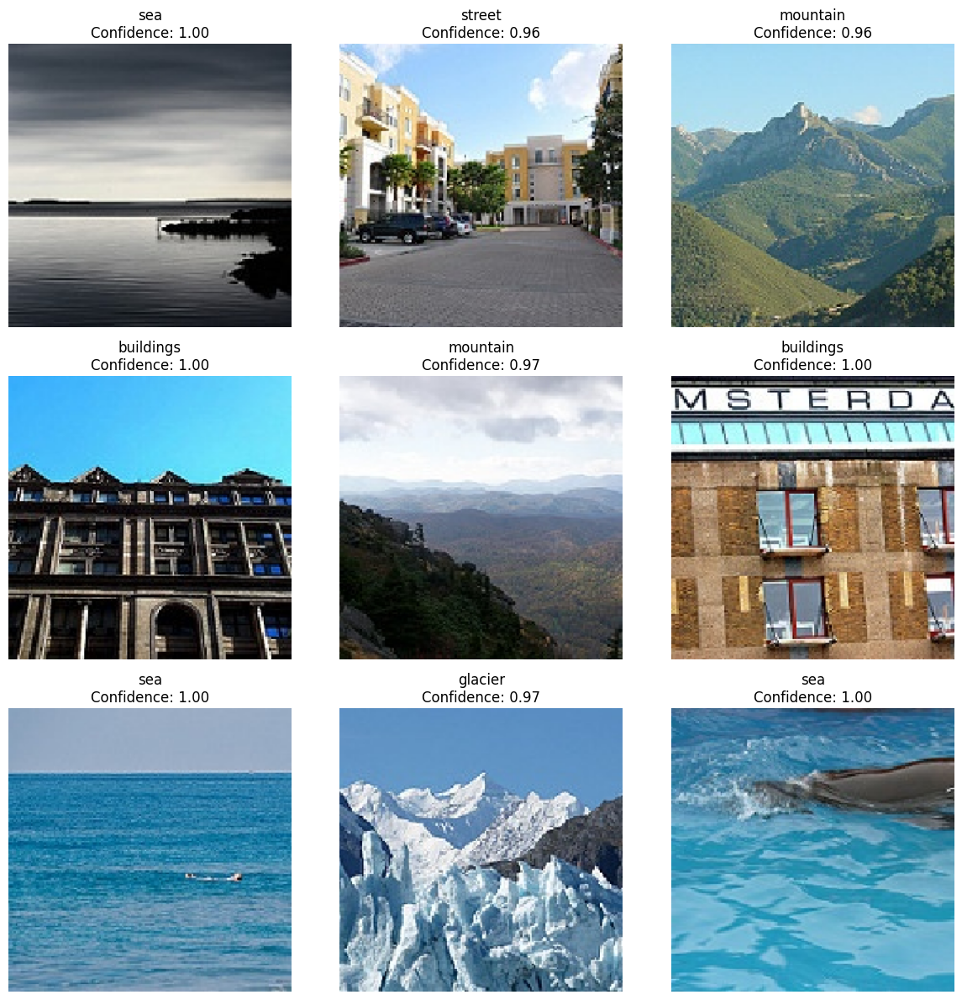

In [ ]:
# =============================
# 20. Predict on Unlabeled Images from seg_pred
# =============================
# This optional section predicts labels for unlabelled images in the seg_pred folder.

pred_image_paths = list(pred_dir.glob('*')) if pred_dir.exists() else []
pred_image_paths = [p for p in pred_image_paths if p.is_file() and p.suffix.lower() in IMAGE_EXTENSIONS]

def load_and_prepare_image(img_path, target_size=IMG_SIZE):
    img = keras.utils.load_img(img_path, target_size=target_size)
    arr = keras.utils.img_to_array(img)
    return img, arr

sample_pred_paths = pred_image_paths[:9]

if len(sample_pred_paths) == 0:
    print("No prediction images found in pred_dir. Check the dataset path if you want to run this section.")
else:
    plt.figure(figsize=(12, 12))
    for i, img_path in enumerate(sample_pred_paths):
        pil_img, arr = load_and_prepare_image(img_path)
        input_arr = tf.expand_dims(arr, axis=0)
        input_arr = preprocess_input(tf.cast(input_arr, tf.float32))
        probs = transfer_model.predict(input_arr, verbose=0)
        pred_idx = np.argmax(probs[0])
        pred_label = dataset_class_names[pred_idx]
        conf = probs[0][pred_idx]

        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(pil_img)
        plt.title(f"{pred_label}\nConfidence: {conf:.2f}")
        plt.axis("off")

    plt.tight_layout()
    plt.show()
